# Seleção da Database
## Database: 
Brazilian E-Commerce Public Database by Olist
https://www.kaggle.com/olistbr/brazilian-ecommerce?select=olist_order_items_dataset.csv

### Descrição: 
A database foi provida pela Olist, uma empresa de marketplace situada no Brasil. A Olist conecta pequenos negócios por todo o Brasil de uma forma simples. Vendedores conseguem vender seus produtos diretamente pela Olist Store, as entregas são feitas por meio de parceiros.

### Problema de Negócio:
Quais são os principais fatores que alavancam o número de vendas? Quais os fatores que impactam na avaliação do cliente?

### Perguntas:
- 1. Como as vendas foram afetadas entre 2016 e 2018?

- 2. Existe diferença significativa de venda para cada um dos seguintes fatores:
    - Mês
    - Dia da Semana
    - Método de Pagamento
    - Região   
   
- 3. Quais produtos e categoria possuem maiores vendas?
   
- 4. As notas de review do produto possuem impacto no número de vendas?
    - Realizar plot de nuvem de palavras

- 5. A localização impacta no tempo de entrega?
    - Heatmap por localização (Mapa)

- 6. O tempo de entrega impacta no review do produto?

- 7. Quais categorias são mais consumidas por região?
    - Diferentes regiões possuem maior adesão por diferentes tipos de produto?

In [1]:
import pandas as pd
import numpy as np
import holoviews as hv
import geoviews as gv
import datashader as ds

from warnings import simplefilter
from colorcet import fire, rainbow, bgy, bjy, bkr, kb, kr
from datashader.colors import colormap_select, Greys9
from holoviews.streams import RangeXY
from holoviews.operation.datashader import datashade, dynspread, rasterize
from bokeh.io import push_notebook, show, output_notebook
from datashader.utils import lnglat_to_meters as webm
from datashader import transfer_functions as tf

In [2]:
# Versões dos pacotes usados neste jupyter notebook
%reload_ext watermark
%watermark -a "Herikc Brecher" --iversions

Author: Herikc Brecher e João Hutner

holoviews : 1.14.5
pandas    : 1.2.4
geoviews  : 1.9.1
numpy     : 1.19.5
datashader: 0.13.0



In [3]:
simplefilter(action='ignore', category=FutureWarning)

Loading BokehJS ...

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
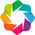

In [4]:
# Ambiente para Analise Geoespacial
output_notebook()
hv.extension('bokeh')

%opts Overlay [width=800 height=600 toolbar='above' xaxis=None yaxis=None]
%opts QuadMesh [tools=['hover'] colorbar=True] (alpha=0 hover_alpha=0.2)

T = 0.05
PX = 1

In [5]:
# Seed de Aleatoriedade
seed_ = 194
np.random.seed(seed_)

# 1. Carregamento dos Dados

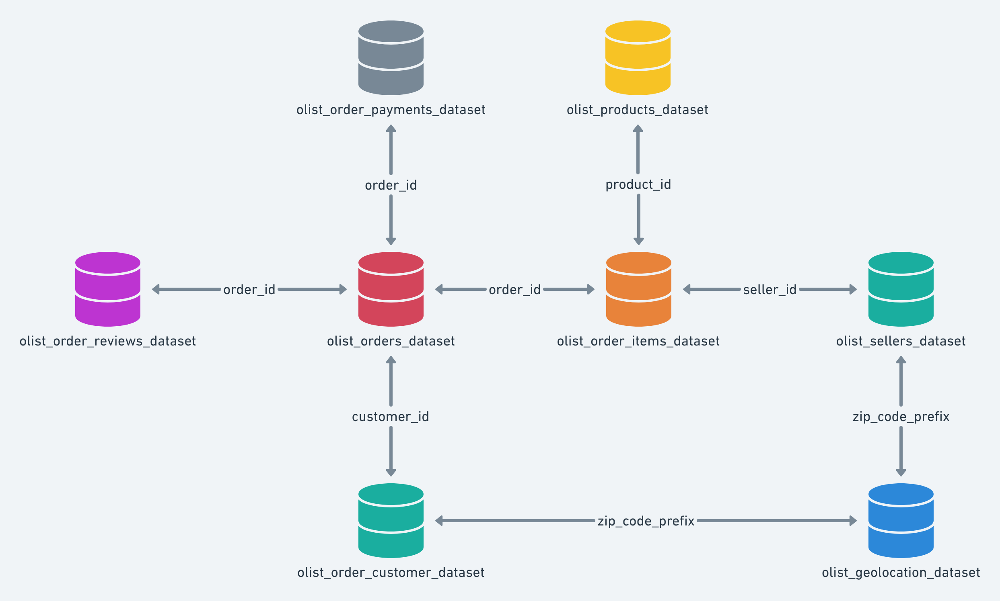

In [6]:
# Carregamento de todos datasets
dtCustomers = pd.read_csv('../data/olist_customers_dataset.csv', encoding = 'utf8', dtype={'customer_zip_code_prefix': str})
dtGeolocation = pd.read_csv('../data/olist_geolocation_dataset.csv', encoding = 'utf8', dtype={'geolocation_zip_code_prefix': str})
dtOrderItems = pd.read_csv('../data/olist_order_items_dataset.csv', encoding = 'utf8')
dtOrderPayments = pd.read_csv('../data/olist_order_payments_dataset.csv', encoding = 'utf8')
dtOrderReviews = pd.read_csv('../data/olist_order_reviews_dataset.csv', encoding = 'utf8')
dtOrders = pd.read_csv('../data/olist_orders_dataset.csv', encoding = 'utf8')
dtProducts = pd.read_csv('../data/olist_products_dataset.csv', encoding = 'utf8')
dtSellers = pd.read_csv('../data/olist_sellers_dataset.csv', encoding = 'utf8')

## 1.1 Adicionando Regiões de cada Estado

In [7]:
regioes = {
    'AC': 'Norte',
    'AL': 'Nordeste',
    'AP': 'Norte',
    'AM': 'Norte',
    'BA': 'Nordeste',
    'CE': 'Nordeste',
    'DF': 'CentroOeste',
    'ES': 'Sudeste',
    'GO': 'CentroOeste',
    'MA': 'Nordeste',
    'MT': 'CentroOeste',
    'MS': 'CentroOeste',
    'MG': 'Sudeste',
    'PA': 'Norte',
    'PB': 'Nordeste',
    'PR': 'Sul',
    'PE': 'Nordeste',
    'PI': 'Nordeste',
    'RJ': 'Sudeste',
    'RN': 'Nordeste',
    'RS': 'Sul',
    'RO': 'Norte',
    'RR': 'Norte',
    'SC': 'Sul',
    'SP': 'Sudeste',
    'SE': 'Nordeste',
    'TO': 'Norte'
}

In [8]:
dtCustomers['regiao'] =  dtCustomers['customer_state'].copy()

In [9]:
dtCustomers = dtCustomers.replace({'regiao': regioes})

In [10]:
dtCustomers.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,regiao
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,Sudeste
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,09790,sao bernardo do campo,SP,Sudeste
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,01151,sao paulo,SP,Sudeste
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,08775,mogi das cruzes,SP,Sudeste
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP,Sudeste


In [11]:
dtSellers['regiao'] =  dtSellers['seller_state'].copy()

In [12]:
dtSellers = dtCustomers.replace({'regiao': regioes})

In [13]:
dtSellers.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,regiao
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,Sudeste
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,09790,sao bernardo do campo,SP,Sudeste
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,01151,sao paulo,SP,Sudeste
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,08775,mogi das cruzes,SP,Sudeste
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP,Sudeste


In [14]:
dtGeolocation['regiao'] =  dtGeolocation['geolocation_state'].copy()

In [15]:
dtGeolocation = dtGeolocation.replace({'regiao': regioes})

In [16]:
dtGeolocation.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state,regiao
0,01037,-23.545621,-46.639292,sao paulo,SP,Sudeste
1,01046,-23.546081,-46.644820,sao paulo,SP,Sudeste
2,01046,-23.546129,-46.642951,sao paulo,SP,Sudeste
3,01041,-23.544392,-46.639499,sao paulo,SP,Sudeste
4,01035,-23.541578,-46.641607,sao paulo,SP,Sudeste


## 11. Analise Geoespacial no Brasil

Inspiração: https://www.kaggle.com/andresionek/geospatial-analysis-of-brazilian-e-commerce

In [17]:
agg_name = 'geolocation_zip_code_prefix'

In [18]:
def plot_map(data, label, agg_data, agg_name, cmap):
    url="http://server.arcgisonline.com/ArcGIS/rest/services/Canvas/World_Dark_Gray_Base/MapServer/tile/{Z}/{Y}/{X}.png"
    
    geomap = gv.WMTS(url)
    points = hv.Points(gv.Dataset(data, kdims=['x', 'y'], vdims=[agg_name]))
    agg = datashade(points, element_type=gv.Image, aggregator=agg_data, cmap=cmap)
    zip_codes = dynspread(agg, threshold=T, max_px=PX)
    hover = hv.util.Dynamic(rasterize(points, aggregator=agg_data, width=50, height=25, streams=[RangeXY]), operation=hv.QuadMesh)
    hover = hover.options(cmap=cmap)
    img = geomap * zip_codes * hover
    img = img.relabel(label)
    
    return img

In [19]:
dtGeolocation.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state,regiao
0,01037,-23.545621,-46.639292,sao paulo,SP,Sudeste
1,01046,-23.546081,-46.644820,sao paulo,SP,Sudeste
2,01046,-23.546129,-46.642951,sao paulo,SP,Sudeste
3,01041,-23.544392,-46.639499,sao paulo,SP,Sudeste
4,01035,-23.541578,-46.641607,sao paulo,SP,Sudeste


In [20]:
dtGeolocation.dtypes

geolocation_zip_code_prefix     object
geolocation_lat                float64
geolocation_lng                float64
geolocation_city                object
geolocation_state               object
regiao                          object
dtype: object

In [21]:
dtGeoMod = dtGeolocation.copy()

In [22]:
dtGeoMod['geolocation_zip_code_prefix_1_digits'] = dtGeoMod['geolocation_zip_code_prefix'].str[0:1]
dtGeoMod['geolocation_zip_code_prefix_2_digits'] = dtGeoMod['geolocation_zip_code_prefix'].str[0:2]
dtGeoMod['geolocation_zip_code_prefix_3_digits'] = dtGeoMod['geolocation_zip_code_prefix'].str[0:3]
dtGeoMod['geolocation_zip_code_prefix_4_digits'] = dtGeoMod['geolocation_zip_code_prefix'].str[0:4]

In [23]:
dtGeoMod.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state,regiao,geolocation_zip_code_prefix_1_digits,geolocation_zip_code_prefix_2_digits,geolocation_zip_code_prefix_3_digits,geolocation_zip_code_prefix_4_digits
0,01037,-23.545621,-46.639292,sao paulo,SP,Sudeste,0,01,010,0103
1,01046,-23.546081,-46.644820,sao paulo,SP,Sudeste,0,01,010,0104
2,01046,-23.546129,-46.642951,sao paulo,SP,Sudeste,0,01,010,0104
3,01041,-23.544392,-46.639499,sao paulo,SP,Sudeste,0,01,010,0104
4,01035,-23.541578,-46.641607,sao paulo,SP,Sudeste,0,01,010,0103


In [24]:
# Removendo outliers, iremos utilizar somente coordenadas no Brasil

# Pontos mais extremos do Brasil
dtGeoMod = dtGeoMod[dtGeoMod['geolocation_lat'] <= 5.27438888]
dtGeoMod = dtGeoMod[dtGeoMod['geolocation_lng'] >= -73.98283055]
dtGeoMod = dtGeoMod[dtGeoMod['geolocation_lat'] >= -33.75116944]
dtGeoMod = dtGeoMod[dtGeoMod['geolocation_lng'] <=  -34.79314722]

In [25]:
x, y = webm(dtGeoMod['geolocation_lng'], dtGeoMod['geolocation_lat'])
dtGeoMod['x'] = pd.Series(x)
dtGeoMod['y'] = pd.Series(y)

In [26]:
dtGeoMod.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state,regiao,geolocation_zip_code_prefix_1_digits,geolocation_zip_code_prefix_2_digits,geolocation_zip_code_prefix_3_digits,geolocation_zip_code_prefix_4_digits,x,y
0,01037,-23.545621,-46.639292,sao paulo,SP,Sudeste,0,01,010,0103,-5.191862e+06,-2.698137e+06
1,01046,-23.546081,-46.644820,sao paulo,SP,Sudeste,0,01,010,0104,-5.192478e+06,-2.698193e+06
2,01046,-23.546129,-46.642951,sao paulo,SP,Sudeste,0,01,010,0104,-5.192270e+06,-2.698199e+06
3,01041,-23.544392,-46.639499,sao paulo,SP,Sudeste,0,01,010,0104,-5.191885e+06,-2.697988e+06
4,01035,-23.541578,-46.641607,sao paulo,SP,Sudeste,0,01,010,0103,-5.192120e+06,-2.697646e+06


In [27]:
dtGeoMod['geolocation_zip_code_prefix'] = dtGeoMod['geolocation_zip_code_prefix'].astype(int)
dtGeoMod['geolocation_zip_code_prefix_1_digits'] = dtGeoMod['geolocation_zip_code_prefix_1_digits'].astype(int)
dtGeoMod['geolocation_zip_code_prefix_2_digits'] = dtGeoMod['geolocation_zip_code_prefix_2_digits'].astype(int)
dtGeoMod['geolocation_zip_code_prefix_3_digits'] = dtGeoMod['geolocation_zip_code_prefix_3_digits'].astype(int)
dtGeoMod['geolocation_zip_code_prefix_4_digits'] = dtGeoMod['geolocation_zip_code_prefix_4_digits'].astype(int)

## 11.1 Pedidos Realizados pelo Brasil

É perceptivel que as regiões do Sul e Sudeste possuem um maior numero de vendas do que as demais, principalmente na região Sudeste.

In [28]:
plot_map(dtGeoMod, 'CEP no Brasil', ds.min(agg_name), agg_name, cmap=rainbow)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [x,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [x,y]   (x_y geolocation_zip_code_prefix)

Focando no estado de São Paulo é perceptivel um grande numero de pedidos, representando aproximadamente 40% dos pedidos.

In [29]:
plot_map(dtGeoMod[dtGeoMod['geolocation_state'] == 'SP'], 'CEP no Estado de São Paulo', ds.min(agg_name), agg_name, cmap = rainbow)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [x,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [x,y]   (x_y geolocation_zip_code_prefix)

In [30]:
plot_map(dtGeoMod[dtGeoMod['geolocation_city'] == 'sao paulo'], 'CEP na Cidade de São Paulo', ds.min(agg_name), agg_name, cmap = rainbow)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [x,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [x,y]   (x_y geolocation_zip_code_prefix)

Focando no estado de Santa Catarina é claro uma diminuição brusca no numero de vendas, lembrando que SC é o 6 estado com mais vendas.

In [31]:
plot_map(dtGeoMod[dtGeoMod['geolocation_state'] == 'SC'], 'CEP no Estado de Santa Catarina', ds.min(agg_name), agg_name, cmap = rainbow)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [x,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [x,y]   (x_y geolocation_zip_code_prefix)

In [32]:
plot_map(dtGeoMod[dtGeoMod['geolocation_city'] == 'itajai'], 'CEP na Cidade de Itajaí', ds.min(agg_name), agg_name, cmap = rainbow)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [x,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [x,y]   (x_y geolocation_zip_code_prefix)

## 11.2 Regiões com maior faturamento no Brasil

In [33]:
dtCustomers.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,regiao
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,Sudeste
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,09790,sao bernardo do campo,SP,Sudeste
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,01151,sao paulo,SP,Sudeste
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,08775,mogi das cruzes,SP,Sudeste
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP,Sudeste


In [34]:
dtCustomersTemp = dtCustomers.copy()

In [35]:
dtCustomersTemp['customer_zip_code_prefix_3_digits'] = dtCustomersTemp['customer_zip_code_prefix'].str[0:3]
dtCustomersTemp['customer_zip_code_prefix_3_digits'] = dtCustomersTemp['customer_zip_code_prefix_3_digits'].astype(int)

dtGeoModBR = dtGeoMod.set_index('geolocation_zip_code_prefix_3_digits').copy()

In [36]:
dtOrderItems.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


In [37]:
dtOrdersTemp = dtOrders.merge(dtOrderItems, on='order_id')
dtOrdersTemp = dtOrdersTemp.merge(dtCustomersTemp, on='customer_id')
dtOrdersTemp = dtOrdersTemp.merge(dtOrderReviews, on = 'order_id')

In [38]:
dtFiltrado = dtOrdersTemp.groupby('customer_zip_code_prefix_3_digits')['price'].sum().to_frame()
revenue = dtGeoModBR.join(dtFiltrado)
agg_name = 'revenue'
revenue[agg_name] = revenue.price / 1000

Olhando para um heatmap de faturamento, é claro que os estados na região Sudeste possuem um faturamento superior em relação aos outros estados, ainda é visivel um faturamento alto na região Sul e uma distribuição grande pela região do Nordeste.

In [39]:
plot_map(revenue, 'Faturamento no Brasil (Em milhares de R$)', ds.mean(agg_name), agg_name, cmap=fire)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [x,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [x,y]   (x_y revenue)

In [40]:
dtFiltrado = dtOrdersTemp.groupby('order_id').agg({'price': 'sum', 'customer_zip_code_prefix_3_digits': 'max'})
dtFiltrado = dtFiltrado.groupby('customer_zip_code_prefix_3_digits')['price'].mean().to_frame()
avg_ticket = dtGeoModBR.join(dtFiltrado)
agg_name = 'avg_ticket'
avg_ticket[agg_name] = avg_ticket.price

Já em relação ao Ticket Medio, é claro que as regiões do Nordeste possuem um ticket medio superior em relação ao Sudeste. É possível analisar que apesar de os estados do Nordeste possuirem um numero de pedidos menor, estão dispostos a realizar mais compras conjuntas. Isso pode se dar pelo baixo volume de compras que pode não ser representativo ou devido ao acumulo de diversos itens em unico pedido.

In [41]:
plot_map(avg_ticket, 'Ticket Medio em R$ no Brasil', ds.mean(agg_name), agg_name, cmap=bgy)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [x,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [x,y]   (x_y avg_ticket)

## 11.3 Regiões com maior taxa de transporte em relação ao pedido

In [42]:
dtFiltrado = dtOrdersTemp.groupby('order_id').agg({'price': 'sum', 'freight_value': 'sum', 'customer_zip_code_prefix_3_digits': 'max'})
agg_name = 'freight_ratio'
dtFiltrado[agg_name] = dtFiltrado['freight_value'] / dtFiltrado['price']
dtFiltrado = dtFiltrado.groupby('customer_zip_code_prefix_3_digits')[agg_name].mean().to_frame()
freight_ratio = dtGeoModBR.join(dtFiltrado)

Mais uma vez é perceptivel que as regiões do Sudeste possuem uma taxa de transporte menor em relação ao pedido, isso se da pois a maioria das distribuidoras de carga e centrais de distribuição ficam localizadas nessa região. Assim é possível diminuir o valor do frete. Em contrapartida é visível que a região do Nordeste possui uma tendência a pagar mais caro pelo transporte, fazendo sentido com a relação feita anteriormente que os pedidos devem acumular mais produtos para compensar o valor do transporte.

In [43]:
plot_map(freight_ratio, 'Taxa de Transporte em Relação ao Pedido no Brasil', ds.mean(agg_name), agg_name, cmap=bgy)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [x,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [x,y]   (x_y freight_ratio)

## 11.4 Tempo Medio de Entrega

In [44]:
dtOrdersTemp['order_delivered_customer_date'] = pd.to_datetime(dtOrdersTemp['order_delivered_customer_date'])
dtOrdersTemp['order_estimated_delivery_date'] = pd.to_datetime(dtOrdersTemp['order_estimated_delivery_date'])
dtOrdersTemp['order_delivered_carrier_date'] = pd.to_datetime(dtOrdersTemp['order_delivered_carrier_date'])
dtOrdersTemp['actual_delivery_time'] = dtOrdersTemp['order_delivered_customer_date'] - dtOrdersTemp['order_delivered_carrier_date']
dtOrdersTemp['actual_delivery_time'] = dtOrdersTemp['actual_delivery_time'].dt.days

In [45]:
dtFiltrado = dtOrdersTemp.groupby('customer_zip_code_prefix_3_digits')['actual_delivery_time'].mean().to_frame()
delivery_time = dtGeoModBR.join(dtFiltrado)
agg_name = 'avg_delivery_time'
delivery_time[agg_name] = delivery_time['actual_delivery_time']

Analisando o mapa abaixo é perceptivel que a região do Sudeste possuem uma entrega mais rapida, também é visualizado que as região do Sul possui um leve aumento no prazo de entrega. Já os estados da região Norte e Nordeste possuem um aumento consideravel, levando a um frete mais caro e mais demorado para essas regiões.

In [46]:
plot_map(delivery_time, 'Tempo Medio de Entrega em Dias no Brasil', ds.mean(agg_name), agg_name, cmap=bjy)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [x,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [x,y]   (x_y avg_delivery_time)

## 11.5 Review Medio Por Região

In [47]:
dtFiltrado = dtOrdersTemp.groupby('customer_zip_code_prefix_3_digits')['review_score'].mean().to_frame()
score = dtGeoModBR.join(dtFiltrado)
agg_name = 'avg_score'
score[agg_name] = score['review_score']

Analisando o grafico abaixo dos reviews realizados dos pedidos realizados no Brasil, é possível identificar que a região próxima ao Rio de Janeiro possui um acumulo maior de avaliações negativas, o mesmo serve para algumas regiões do Nordeste em sentido a região Norte. Já os pedidos na região Sul aparentam possuir uma maior taxa da avaliações positivas. 

In [48]:
plot_map(score, 'Review Médio No Brasil', ds.mean(agg_name), agg_name, cmap=bgy)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [x,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [x,y]   (x_y avg_score)

## 11.6 TO DO

- Analisar de forma mais especificas cidades com maior representatividade como: São Paulo, Rio de Janeiro, Porto Alegre, Curitiba, Joinville, Brasilia e Fortaleza.

# O resto é história